# Extract and compare DEM elevation with ICESat-2 Points
1. Merge DEMs strips is more than 1
2. Extract Elevation for DEM
3. Note Time and Time difference between acquisition of ICESat-2, DEM imagery, and if DEM composed of cross-track imageries

April 30, 2020  

In [1]:
%matplotlib inline

In [2]:
import os
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.figsize': (12, 7), 'font.size': 10})

import numpy as np
import pandas as pd
from shapely.geometry import Polygon, Point
import geopandas as gpd
import xarray as xr
# import rasterio as rio

import hvplot
import geoviews as gv
import hvplot.pandas
import hvplot.xarray

In [3]:
# Setup data paths
region = 'region_02_greenland_southeast'
dir_prefix = '/fs/byo/howat-data5' #data4, 5 'D:' 'V:' '/fs/byo/howat-data4' #'/fs/project/howat.4' #/REMA/region_20_ross_shelf
dem_type = ['REMA', 'EarthDEM', 'ArcticDEM']
dem_type = dem_type[2] # MUST CHOOSE
# Here we will start to ICESat-2 because all of these have corresponding DEM folder
base_icesat2_path = f'/fs/project/howat.4/icesat2/{dem_type}/{region}' #_{short_name} # Set the icesat2_path : where ICESat-2 files are staged
strips = os.listdir(base_icesat2_path)
# Select a particular satellite, WV03 for example
# strips = [strip for strip in strips if strip.startswith('WV03')]
len(strips)

693

In [35]:
# fig_folder = '/home/yadav.111/figs_icesat/ATL06'
analysis_folder = f'/fs/project/howat.4/icesat2/prototyping/analysis/{dem_type}/{region}'
if not os.path.exists(analysis_folder):
    os.makedirs(analysis_folder)

# strip = strips[90]
# strip = 'W1W1_20190416_1020010084CEDB00_1020010085562400_2m_lsf_v030403'
strip = strips[4]
print(strip)
icesat2_path = f'{base_icesat2_path}/{strip}'
files = os.listdir(f'{icesat2_path}')

outline = gpd.read_file(f'{icesat2_path}/strip_outline.shp')


hdf_files = [f for f in files if f.endswith('.h5')]
shp_files = [f for f in files if f.endswith('.shp') and 'ATL06' in f]
csv_files = [f for f in files if f.endswith('.csv') and 'ATL06' in f]

W1W1_20190404_1020010084C68800_1020010084E92100_2m_lsf_v030403


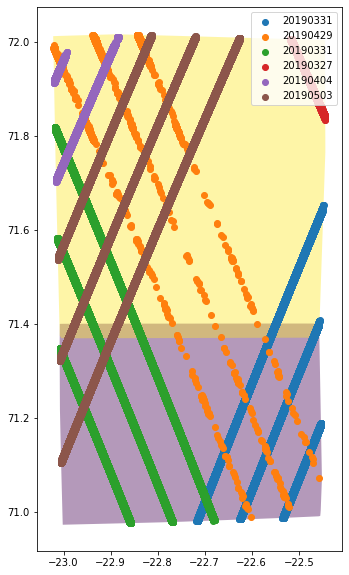

In [30]:
# Quick Check for Data
ax = outline.plot(column='seg_id', alpha=.4, lw=2, figsize=(10,10))
for shp in shp_files:
    gdf = gpd.read_file(f'{icesat2_path}/{shp}', parse_dates=True)
    lbl = shp.split('_')[2][:8] #pd.to_datetime(shp.split('_')[2][:8])
    gdf.plot(ax=ax, label=lbl)
plt.legend(loc=1);

In [31]:
# To pick the largest granule for visualization only
sz_list = [os.path.getsize(f'{icesat2_path}/{hdf}') for hdf in hdf_files]
idx = sz_list.index(max(sz_list)) #largest index
print('No of shp files',len(shp_files), len(hdf_files))
# print(outline.area)

fname = shp_files[idx].split('.shp')[0]

No of shp files 6 6


In [33]:
shp_files

['processed_ATL06_20190331212309_00400305_002_01.shp',
 'processed_ATL06_20190429071414_04740303_002_01.shp',
 'processed_ATL06_20190331083815_00320303_002_01.shp',
 'processed_ATL06_20190327084635_13580203_002_01.shp',
 'processed_ATL06_20190404211449_01010305_002_01.shp',
 'processed_ATL06_20190503195047_05430305_002_01.shp']

## Choose a corresponding DEM Strip for Analysis

In [34]:
## Now get the DEM (Rema for example)

# strip_version = ['v4', 'unf']
# strip_version = strip_version[0] #choose based on how folder names look

# strips_folder = f'{dir_prefix}/{dem_type}/{region}/strips_v4/2m' #f'{dir_prefix}/EarthDEM/{region}/strips_unf/2m' #for Alaska but not tried yet as ATL06 does not exist for this region
# strips = os.listdir(f'{strips_folder}') Done use this, use the ones got from icesat-2 listing

# strips_folder = f'' #f'{dir_prefix}/EarthDEM/{region}/strips_unf/2m' #for Alaska but not tried yet as ATL06 does not exist for this region
# dem_folder =    f'{strips_folder}/{strip}'
# dem_folder = f'{dir_prefix}/{REMA}/{region}/strips_unf/2m/{strip}'
dem_folder =    f'{dir_prefix}/{dem_type}/{region}/strips_v4/2m/{strip}'
tifs = [tif for tif in os.listdir(dem_folder) if tif.endswith('.tif')]
tifs

['W1W1_20190404_1020010084C68800_1020010084E92100_2m_lsf_seg2_dem.tif',
 'W1W1_20190404_1020010084C68800_1020010084E92100_2m_lsf_seg1_dem.tif',
 'W1W1_20190404_1020010084C68800_1020010084E92100_2m_lsf_seg2_ortho.tif',
 'W1W1_20190404_1020010084C68800_1020010084E92100_2m_lsf_seg1_ortho.tif',
 'W1W1_20190404_1020010084C68800_1020010084E92100_2m_lsf_seg2_dem_10m.tif',
 'W1W1_20190404_1020010084C68800_1020010084E92100_2m_lsf_seg1_dem_10m.tif',
 'W1W1_20190404_1020010084C68800_1020010084E92100_2m_lsf_seg2_matchtag.tif',
 'W1W1_20190404_1020010084C68800_1020010084E92100_2m_lsf_seg1_matchtag.tif',
 'W1W1_20190404_1020010084C68800_1020010084E92100_2m_lsf_seg2_bitmask.tif',
 'W1W1_20190404_1020010084C68800_1020010084E92100_2m_lsf_seg1_bitmask.tif']

In [36]:
# Load ATL parsed data
df = pd.read_csv(f'{icesat2_path}/{fname}.csv', parse_dates=True)
gdf = gpd.read_file(f'{icesat2_path}/{fname}.shp', parse_dates=True)
# Pick only the good quality data [verify if zero or one means good]
df = df[df.q_flag==0]
gdf = gdf[gdf.q_flag==0]
df = df.reset_index(drop=True)
gdf = gdf.reset_index(drop=True)
#Also reset index
gtls = list(df.strip.unique())
print(len(df), gtls)
# gv.tile_sources.ESRI * gdf.hvplot.points(geo=True, color='strip', alpha=0.7, width=500, height=700, hover=['strip', 'h_te_media'])

17456 ['gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r']


In [37]:
base = gv.tile_sources.ESRI
gtracks = gdf.hvplot.points(geo=True, color='strip', s=10, alpha=0.7, width=500, height=600)
terrain_scatter = df.hvplot(y='lat', x='h_li', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters').relabel('Elevation') # by='strip', 
fig1 = base * gtracks + terrain_scatter
# hvplot.save(fig1, f'{analysis_folder}/test.png') #now working newly due to path for firefox or chromium
fig1

:Layout
   .Overlay.I           :Overlay
      .WMTS.I   :WMTS   [Longitude,Latitude]
      .Points.I :Points   [Longitude,Latitude]   (strip)
   .NdOverlay.Elevation :NdOverlay   [strip]
      :Scatter   [h_li]   (lat)

In [59]:
df.hvplot(y='lat', x='h_li', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters', subplots=True)

:NdLayout   [strip]
   :Scatter   [h_li]   (lat)

In [38]:
# If there is more than one DEM, find a way to merge them into one seamless DEM
[tif for tif in os.listdir(dem_folder) if tif.endswith('_dem.tif')]

['W1W1_20190404_1020010084C68800_1020010084E92100_2m_lsf_seg2_dem.tif',
 'W1W1_20190404_1020010084C68800_1020010084E92100_2m_lsf_seg1_dem.tif']

In [39]:
# Can have one or more DEMs depending on how it was produced
segment_index = 0
dem_tif = [tif for tif in os.listdir(dem_folder) if tif.endswith('_dem.tif')]
ortho_tif = [tif for tif in os.listdir(dem_folder) if tif.endswith('_ortho.tif')][segment_index]
print(dem_tif)
dem_tif = dem_tif[segment_index] #Choose one DEM (or better find a way to merge; but this will also significantly increase the size of data)
dem_tif

['W1W1_20190404_1020010084C68800_1020010084E92100_2m_lsf_seg2_dem.tif', 'W1W1_20190404_1020010084C68800_1020010084E92100_2m_lsf_seg1_dem.tif']


'W1W1_20190404_1020010084C68800_1020010084E92100_2m_lsf_seg2_dem.tif'

## Use Xarray load and analyze DEM

In [41]:
da = xr.open_rasterio(f'{dem_folder}/{dem_tif}') #, chunks={'x':2**11, 'y':2**11}
da = da.load()
# da = xr.open_rasterio(f'{dem_folder}/{ortho_tif}')
nodata_value = da.attrs['nodatavals'][0]
da.data[da.data==nodata_value] = np.nan
print(nodata_value)

-9999.0


In [42]:
# Change Icesat shapefile projection to match DEM's projection
# Else can't extract elevation from DEM
# Required to overlay plots as well
proj4 = da.crs #dem.projection.ExportToProj4() # but there is extra space at the end
gdf1 = gdf.to_crs(proj4) 
# gdf1.iloc[1].geometry.x, gdf1.iloc[1].geometry.y

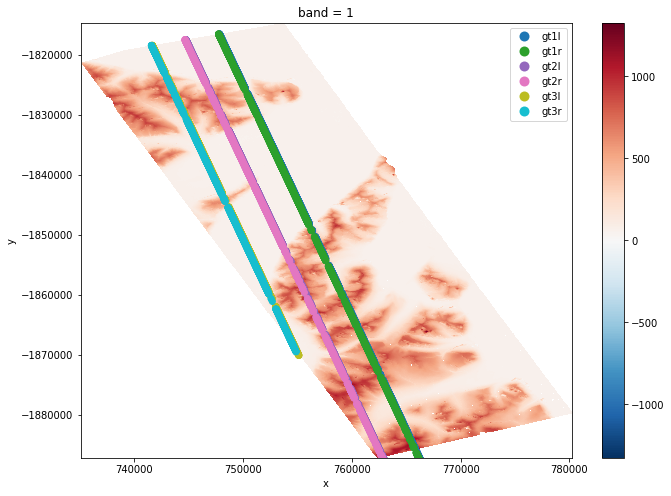

In [43]:
# da.plot.imshow(cmap='gist_earth')
ax = gdf1.plot(column='strip', legend=True, figsize=(11, 8))
da.sel(band=1).plot.imshow(ax=ax);

## Extraction pixel value from raster for each point

In [44]:
def getPixVal(pt):
    """ Given a Geopandas/Shapely Point geometry, extract the pixel value from the Xarray raster """
    #x, y = pt.coords[:][0]
    out = da.sel(x = pt.x, y=pt.y, method='nearest')
    return out.values[0]

In [45]:
gdf1['dem'] = gdf1.geometry.apply(getPixVal)
print(len(gdf1[np.isnan(gdf1.dem)])/len(gdf1))
gdf1 = gdf1.dropna() #Drop the Nans from the edges of DEM
gdf1['dif'] = gdf1.h_li - gdf1.dem
gdf1 = gdf1.drop(['t_dt', 'q_flag'], axis=1)

0.16280934922089826


In [46]:
gdf1.head()

,t_dt,h_li,q_flag,strip,geometry,dem,dif
0,2019-05-03 19:53:31.258000,53.247280,0,gt1l,POINT (747826.590 -1816542.345),54.209187,-0.961906
1,2019-05-03 19:53:31.260000,53.446640,0,gt1l,POINT (747831.634 -1816561.596),54.284985,-0.838345
2,2019-05-03 19:53:31.263000,53.733379,0,gt1l,POINT (747836.677 -1816580.836),54.911022,-1.177643
3,2019-05-03 19:53:31.266000,53.546368,0,gt1l,POINT (747841.727 -1816600.087),54.210167,-0.663799
4,2019-05-03 19:53:31.269000,53.129185,0,gt1l,POINT (747846.785 -1816619.323),53.844498,-0.715313


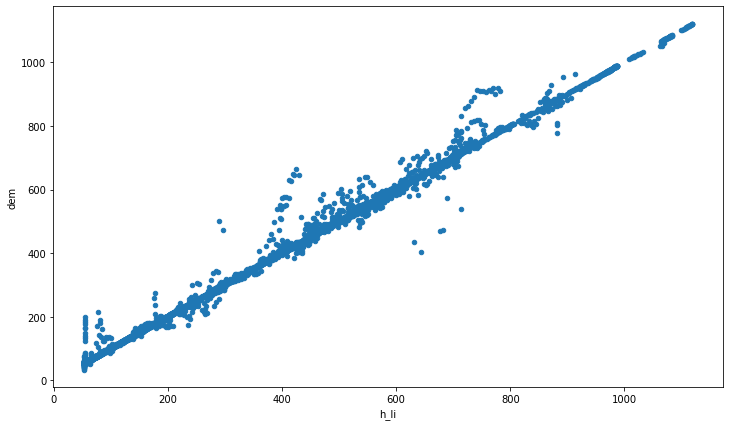

In [51]:
gdf1[['h_li','dem']].plot(kind='scatter', x=0, y=1);

In [55]:
gdf1.head()

,h_li,strip,geometry,dem,dif
0,53.247280,gt1l,POINT (747826.590 -1816542.345),54.209187,-0.961906
1,53.446640,gt1l,POINT (747831.634 -1816561.596),54.284985,-0.838345
2,53.733379,gt1l,POINT (747836.677 -1816580.836),54.911022,-1.177643
3,53.546368,gt1l,POINT (747841.727 -1816600.087),54.210167,-0.663799
4,53.129185,gt1l,POINT (747846.785 -1816619.323),53.844498,-0.715313


In [ ]:
df.hvplot(y='lat', x='h_li', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters', subplots=True)

In [66]:
# gdf1[['h_li','dem']].hvplot(kind='scatter', x=0, y=1);
gdf1[['h_li','dem', 'strip']].hvplot(y='dem', x='h_li', kind='scatter', by='strip', subplots=True)

:NdLayout   [strip]
   :Scatter   [h_li]   (dem)

In [67]:
gdf1[gdf1.strip=='gt2l'][['h_li','dem']].hvplot(kind='scatter', alpha=.5)

:NdOverlay   [Variable]
   :Scatter   [index]   (value)

In [68]:
# gdf1.strip.value_counts()

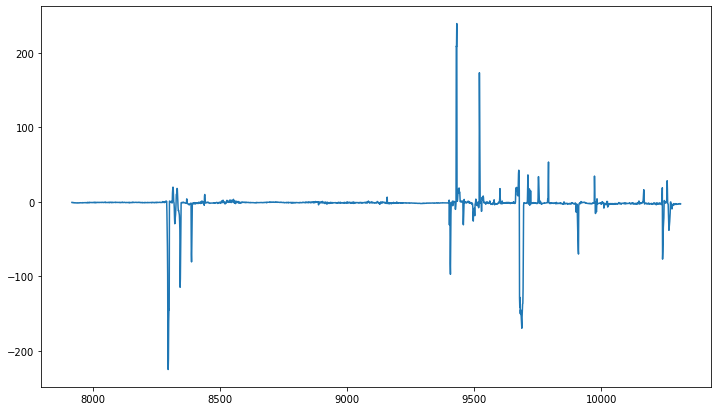

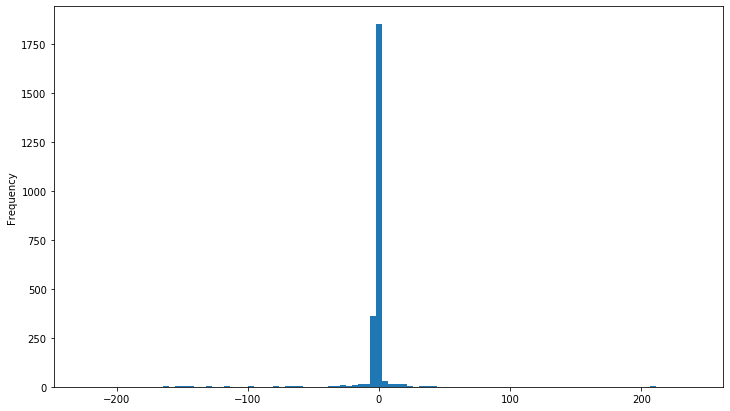

In [69]:
gdf1[gdf1.strip=='gt2l'].dif.plot()
plt.figure()
gdf1[gdf1.strip=='gt2l'].dif.plot(kind='hist', bins=100);

In [71]:
# ortho_tif
ortho = xr.open_rasterio(f'{dem_folder}/{ortho_tif}')
ortho = ortho.load()
nodata_value = ortho.attrs['nodatavals'][0]
# First conver to fload, so it can be converted to nan
ortho.data = ortho.data.astype(float)

ortho.data[ortho.data==nodata_value] = np.nan
print(nodata_value)

0.0


In [73]:
np.nanmax(ortho.data)

2128.0

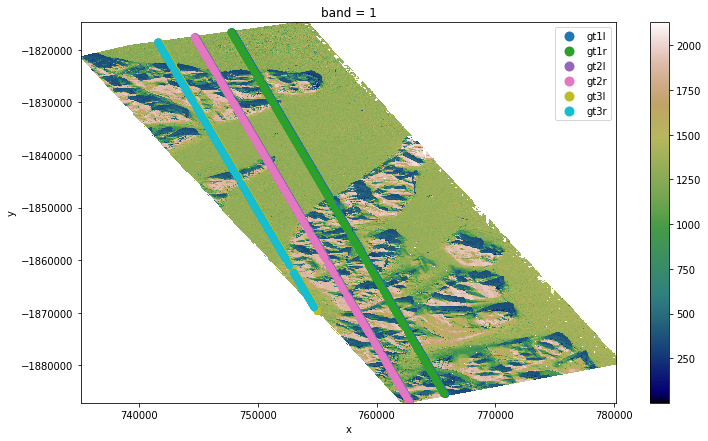

In [74]:
ax = gdf1.plot(column='strip', legend=True)
ortho.sel(band=1).plot.imshow(ax=ax, cmap='gist_earth'); #, cmap='gist_earth'

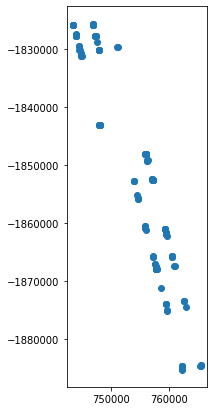

In [91]:
gdf1[np.abs(gdf1.dif)>40].plot();

In [75]:
# gdf2 = gdf1.reset_index(drop = True)

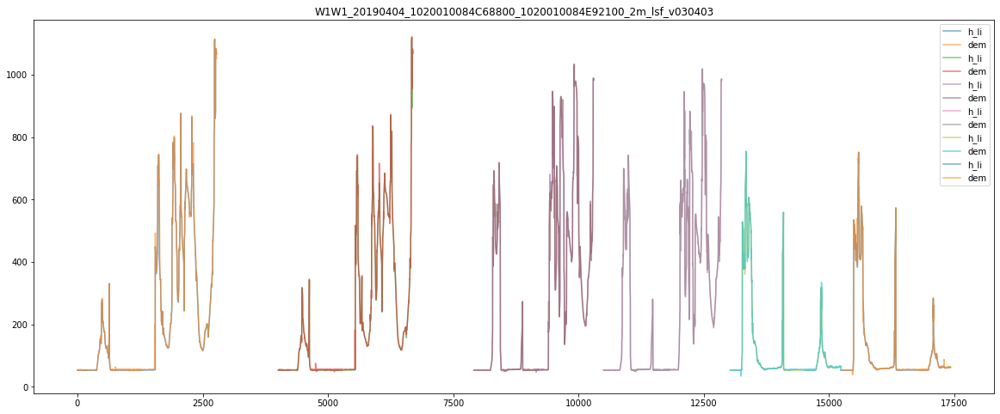

In [76]:
gtls = list(gdf1.strip.value_counts().index) #['gt1l', 'gt1r','gt2l', 'gt2r', 'gt3l','gt3r']
# gtl = gtls[2]
fig, ax = plt.subplots(figsize=(20, 8))
for gtl in gtls:
    gdf1[gdf1.strip==gtl][['h_li', 'dem']].iloc[1:-1].plot(style='-', alpha=.6, title=strip, ax=ax);

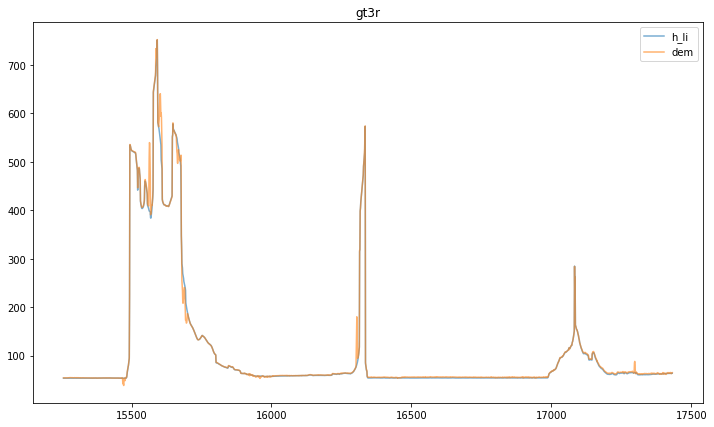

In [77]:
gdf1[gdf1.strip==gtl][['h_li', 'dem']].plot(style='-', alpha=.6, title=gtl);

In [78]:
# gdf1[gdf1.strip==gtl].reset_index()[['h_li', 'dem']].plot(style='-', alpha=.6, title=gtl);

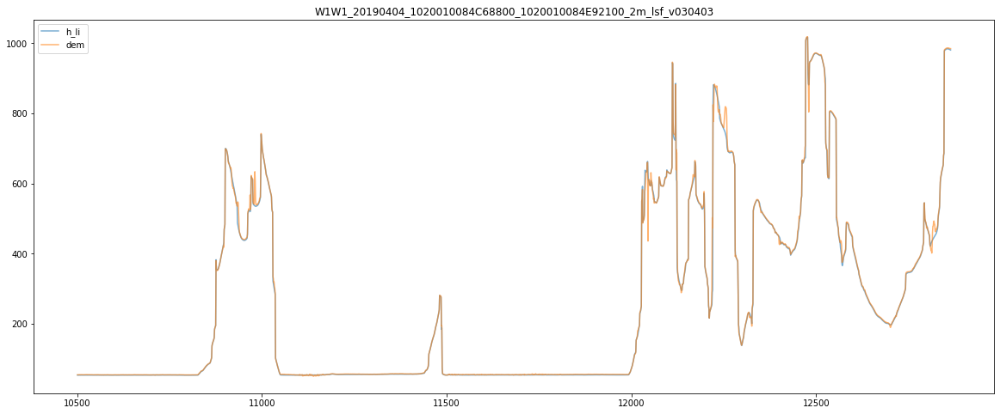

In [79]:
# gdf[['h_li', 'dem']].plot()
fig, ax = plt.subplots(figsize=(20, 8))
# gdf2[gdf2.strip=='gt1l'][['h_li', 'dem']].reset_index(drop=True).iloc[10:-10].plot(style='-', alpha=.6, title=strip, ax=ax); #, ax=ax
gdf1[gdf1.strip==gtls[3]][['h_li', 'dem']].plot(style='-', alpha=.6, title=strip, ax=ax); #, ax=ax

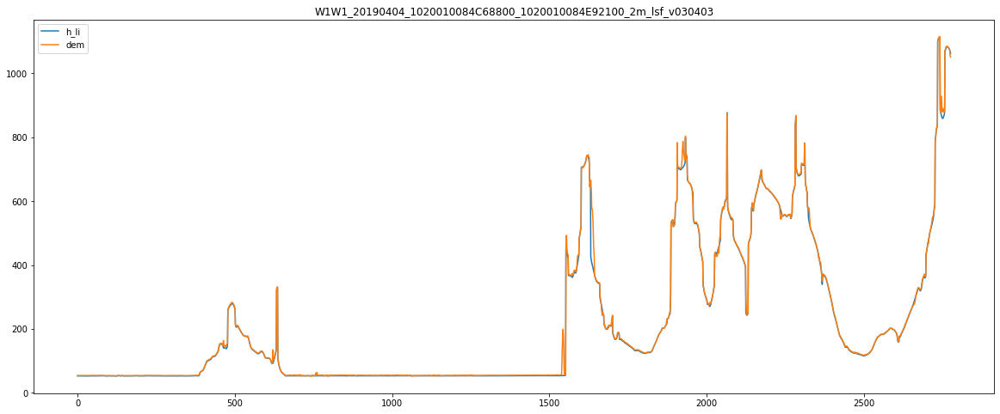

In [80]:
fig, ax = plt.subplots(figsize=(20, 8))
# gdf1[gdf1.strip==gtls[0]][['h_li', 'dem']].reset_index(drop=True).iloc[10:-10].plot(style='-', title=strip, ax=ax); #, ax=ax
gdf1[gdf1.strip==gtls[0]][['h_li', 'dem']].plot(style='-', title=strip, ax=ax); #, ax=ax


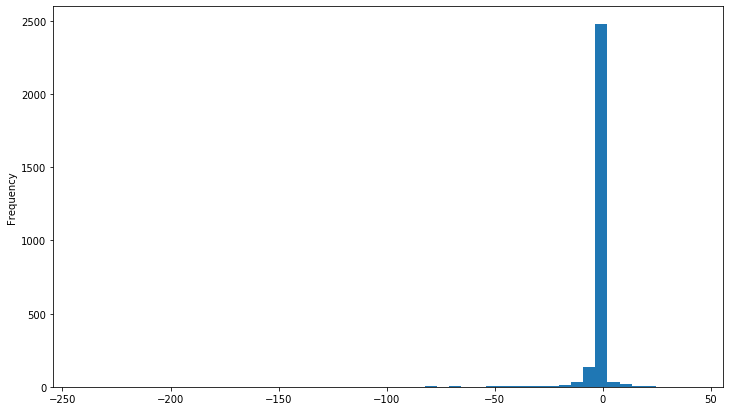

In [81]:
gdf1[gdf1.strip==gtls[0]].dif.plot(kind='hist', bins=50);

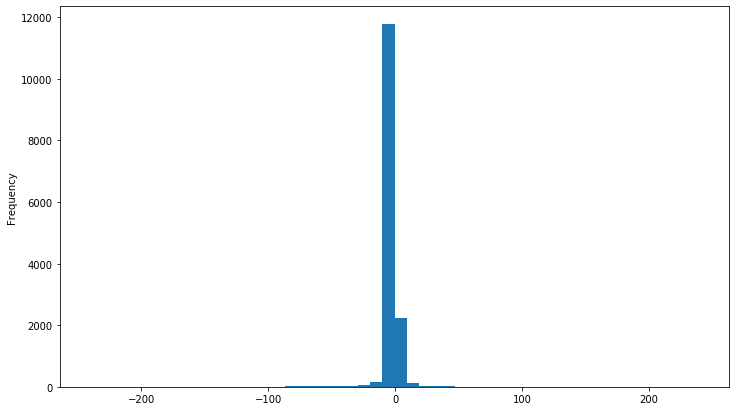

In [83]:
gdf1.dif.plot(kind='hist', bins=50);

In [84]:
gdf1.dif.mean()

-2.0448982635013575

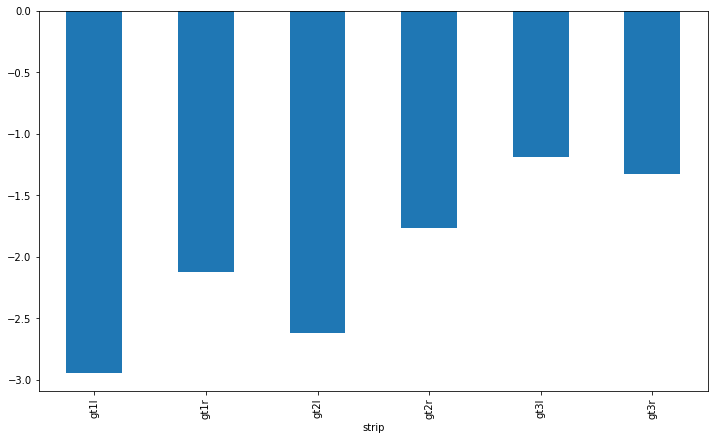

In [85]:
dfg = gdf1.groupby('strip')
dfg.dif.mean().plot(kind='bar');

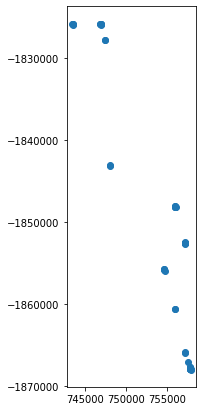

In [88]:
gdf1[np.abs(gdf1.dif)>100].plot()

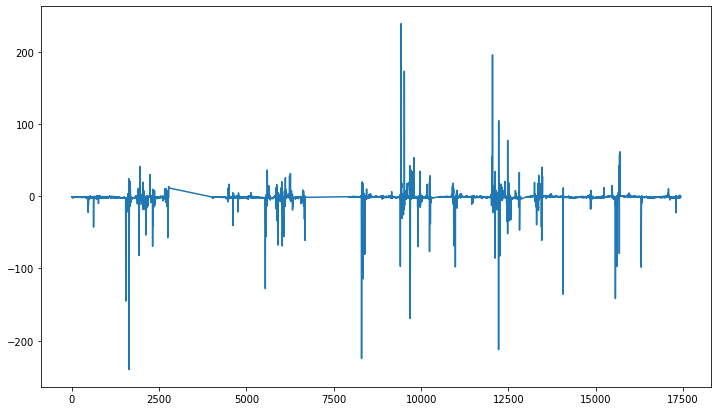

In [87]:
gdf1.dif.plot()

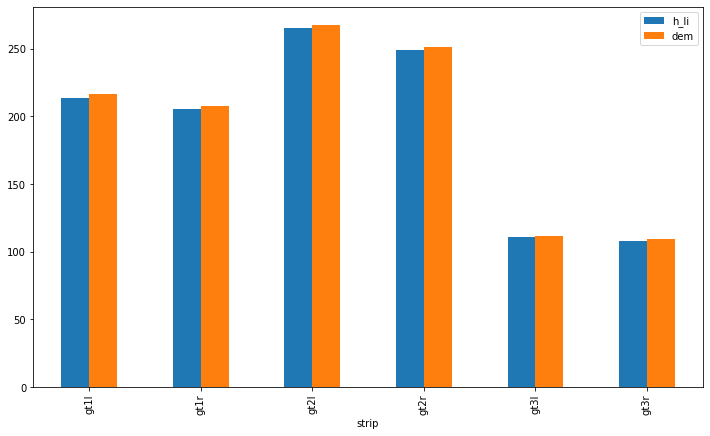

In [93]:
dfg[['h_li', 'dem']].mean().plot(kind='bar');

In [94]:
gdf1.strip.value_counts()

gt1l    2777
gt1r    2691
gt2l    2397
gt2r    2364
gt3l    2211
gt3r    2174
Name: strip, dtype: int64

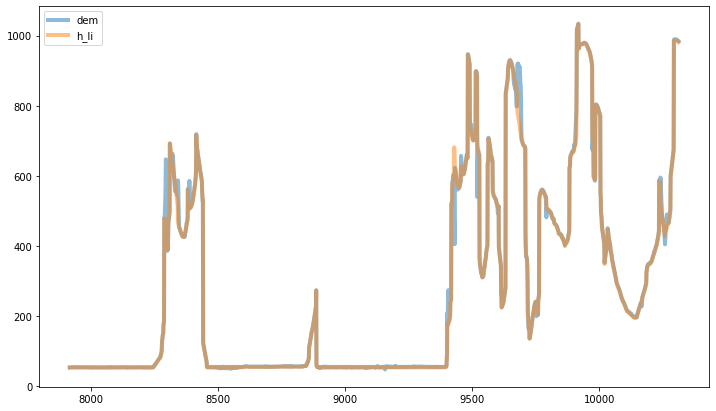

In [95]:
gtl = 'gt2'
ax = gdf1[gdf1.strip==f'{gtl}l'][['dem','h_li']].plot(lw=4, alpha=.5)
# gdf2[gdf2.strip==f'{gtl}r'][['h_li', 'dem']].plot(ax = ax)

In [96]:
#Make dataframe for plotting using hvplot
df2 = pd.DataFrame(gdf1)

In [97]:
gdf1

,h_li,strip,geometry,dem,dif
0,53.247280,gt1l,POINT (747826.590 -1816542.345),54.209187,-0.961906
1,53.446640,gt1l,POINT (747831.634 -1816561.596),54.284985,-0.838345
2,53.733379,gt1l,POINT (747836.677 -1816580.836),54.911022,-1.177643
3,53.546368,gt1l,POINT (747841.727 -1816600.087),54.210167,-0.663799
4,53.129185,gt1l,POINT (747846.785 -1816619.323),53.844498,-0.715313
...,...,...,...,...,...
17426,63.010513,gt3r,POINT (754728.203 -1868953.550),64.158432,-1.147919
17427,63.035145,gt3r,POINT (754733.189 -1868972.842),64.486435,-1.451290
17428,63.134918,gt3r,POINT (754738.178 -1868992.127),63.102028,0.032890
17429,63.223869,gt3r,POINT (754743.171 -1869011.411),62.376949,0.846920


In [98]:
df2.strip.value_counts()

gt1l    2777
gt1r    2691
gt2l    2397
gt2r    2364
gt3l    2211
gt3r    2174
Name: strip, dtype: int64

In [99]:
df2[df2.strip=='gt2l']
# df2[df2.strip=='gt2l'].hvplot(x='lon', y='h_li', kind='scatter', height=450, width=700, s=5, alpha=.9)

,h_li,strip,geometry,dem,dif
7916,53.084320,gt2l,POINT (744741.270 -1817493.300),53.735691,-0.651371
7917,53.166016,gt2l,POINT (744746.242 -1817512.557),53.817745,-0.651730
7918,53.264614,gt2l,POINT (744751.198 -1817531.831),54.039406,-0.774792
7919,53.243729,gt2l,POINT (744756.125 -1817551.100),53.876251,-0.632523
7920,53.116852,gt2l,POINT (744761.038 -1817570.384),54.212818,-1.095966
...,...,...,...,...,...
10308,984.362488,gt2l,POINT (762813.582 -1886862.410),986.914185,-2.551697
10309,983.757996,gt2l,POINT (762818.645 -1886881.696),985.946899,-2.188904
10310,983.048645,gt2l,POINT (762823.725 -1886900.969),985.435669,-2.387024
10311,982.280151,gt2l,POINT (762828.810 -1886920.240),984.577454,-2.297302


In [100]:
first = df2[df2.strip=='gt2l'].hvplot(x='lon', y='h_li', kind='scatter', height=450, width=700, s=5, alpha=.9)
second = df2[df2.strip=='gt2r'].hvplot(x='lon', y='dem', kind='scatter', height=450, width=700, s=1, alpha=.9, ylim=(1400, 2200))# ylim=(1200, 2200) 
first * second

In [81]:
bounds = (1400, 2200)

In [82]:
# one = df2[df2.strip.isin(['gt1l', 'gt1r'])].hvplot(x='lon', y='h_li', kind='scatter', height=450, width=900, s=5, alpha=.9, by='strip') 
a1 = df2[df2.strip=='gt2l'].hvplot(x='lon', y='h_li', kind='scatter', height=450, width=800, s=30, alpha=.5, ylim=bounds).relabel('ATL06')
a2 = df2[df2.strip=='gt2l'].hvplot(x='lon', y='dem', kind='scatter', height=450, width=800, s=1, alpha=.9, ylim=bounds, ylabel='Elevation (meter)', xlabel='Longitude').relabel('DEM')
a1*a2 #+ a3*a4


:Overlay
   .Scatter.ATL06 :Scatter   [lon]   (h_li)
   .Scatter.DEM   :Scatter   [lon]   (dem)

In [83]:
a3 = df2[df2.strip=='gt2r'].hvplot(x='lon', y='h_li', kind='scatter', height=450, width=800, s=40, alpha=.5, ylim=bounds).relabel('ATL06')
a4 = df2[df2.strip=='gt2r'].hvplot(x='lon', y='dem', kind='scatter', height=350, width=800, s=1, alpha=.9, ylim=bounds, ylabel='Elevation (meter)', xlabel='Longitude').relabel('DEM')
a3*a4

:Overlay
   .Scatter.ATL06 :Scatter   [lon]   (h_li)
   .Scatter.DEM   :Scatter   [lon]   (dem)

In [84]:
df2[df2.strip=='gt2r'].hvplot(x='lon', y='dif', kind='scatter', height=200, width=700, s=.15,  ylim=(-4,3), ylabel='meter', xlabel='Longitude')#.relabel('Elevation Difference') #title='Elevation Difference between ATL06 and REMA'

:Scatter   [lon]   (dif)

In [85]:
gdf2.dif.std()

0.9702196892382353

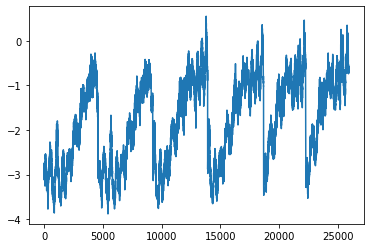

In [86]:
gdf2.dif.plot()

In [87]:
a1*a2 + a3*a4

:Layout
   .Overlay.I  :Overlay
      .Scatter.ATL06 :Scatter   [lon]   (h_li)
      .Scatter.DEM   :Scatter   [lon]   (dem)
   .Overlay.II :Overlay
      .Scatter.ATL06 :Scatter   [lon]   (h_li)
      .Scatter.DEM   :Scatter   [lon]   (dem)

In [88]:
first = df2[df2.strip.isin(['gt1l', 'gt1r'])].hvplot(x='lon', y='h_li', kind='scatter', height=450, width=900, s=5, alpha=.9, by='strip') 
second = df2[df2.strip.isin(['gt1l', 'gt1r'])].hvplot(x='lon', y='dem', kind='scatter', height=450, width=900, s=1, alpha=.9, by='strip', ylim=(1400, 2200))# ylim=(1200, 2200) 
first * second

:Overlay
   .NdOverlay.I  :NdOverlay   [strip]
      :Scatter   [lon]   (h_li)
   .NdOverlay.II :NdOverlay   [strip]
      :Scatter   [lon]   (dem)

In [89]:
df2[df2.strip.isin(['gt1l', 'gt1r'])]

,t_dt,h_li,q_flag,strip,geometry,dem,dif,lon,lat,dem_x
0,2018-12-14 17:39:53.352000,1508.878784,0,gt1l,POINT (-67.70233 -75.00694),1511.755859,-2.877075,-67.702333,-75.006944,NaN
1,2018-12-14 17:39:53.354000,1508.894043,0,gt1l,POINT (-67.70243 -75.00677),1511.888428,-2.994385,-67.702434,-75.006768,NaN
2,2018-12-14 17:39:53.357000,1508.947998,0,gt1l,POINT (-67.70253 -75.00659),1511.749512,-2.801514,-67.702535,-75.006591,NaN
3,2018-12-14 17:39:53.360000,1509.036133,0,gt1l,POINT (-67.70264 -75.00641),1511.958618,-2.922485,-67.702635,-75.006415,NaN
4,2018-12-14 17:39:53.363000,1509.118652,0,gt1l,POINT (-67.70274 -75.00624),1511.996216,-2.877563,-67.702736,-75.006238,NaN
...,...,...,...,...,...,...,...,...,...,...
9255,2018-12-14 17:40:06.842000,1898.252197,0,gt1r,POINT (-68.16014 -74.18507),0.000000,1898.252197,-68.160140,-74.185069,NaN
9256,2018-12-14 17:40:06.845000,1898.076538,0,gt1r,POINT (-68.16024 -74.18489),0.000000,1898.076538,-68.160235,-74.184892,NaN
9257,2018-12-14 17:40:06.847000,1897.864746,0,gt1r,POINT (-68.16033 -74.18472),0.000000,1897.864746,-68.160329,-74.184716,NaN
9258,2018-12-14 17:40:06.850000,1897.681274,0,gt1r,POINT (-68.16042 -74.18454),0.000000,1897.681274,-68.160422,-74.184539,NaN


In [90]:
first = df2.hvplot(y='lon', x='h_li', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters', subplots=True) 
second = df2.hvplot(y='lon', x='dem', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters', subplots=True) 
first * second

:NdLayout   [strip]
   :Overlay
      .Scatter.I  :Scatter   [h_li]   (lon)
      .Scatter.II :Scatter   [dem]   (lon)

In [91]:
third = df2.hvplot(y='lat', x='h_li', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters', subplots=True) 
fourth = df2.hvplot(y='lat', x='dem', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters', subplots=True) 
third * fourth

:NdLayout   [strip]
   :Overlay
      .Scatter.I  :Scatter   [h_li]   (lat)
      .Scatter.II :Scatter   [dem]   (lat)

In [92]:
df2.hvplot(y='lon', x='dem', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters', subplots=True)

:NdLayout   [strip]
   :Scatter   [dem]   (lon)

In [93]:
df2.hvplot(y='h_li')

:Curve   [index]   (h_li)

In [94]:
# df2 = gdf2.drop('geometry', axis=1)

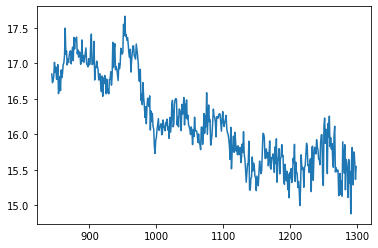

In [101]:
gdf2[gdf2.strip==f'{gtl}r'].dif.plot()

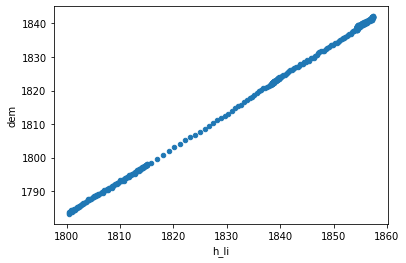

In [102]:
gdf2[gdf2.strip==f'{gtl}r'][['h_li', 'dem']].iloc[2:-10].plot(kind='scatter', x=0, y=1)